In [39]:
import geopandas as gpd
import matplotlib as mpl
import osmnx as ox

ox.settings.cache_folder = "../cache/"
import json
import os.path
import urllib.parse

import contextily as cx
import networkx as nx
from shapely.geometry import LineString, Point, Polygon
from tqdm.notebook import tqdm

tqdm.pandas()


%matplotlib inline
mpl.rcParams["figure.figsize"] = (16, 9)
mpl.rcParams["savefig.dpi"] = 300

## Set Boundary

Load a shapefile containing the boundary of the city of Portland, ME. This will be used to determine which Census blocks to include.

In [2]:
portland_boundary = gpd.read_file(
    "https://services1.arcgis.com/RbMX0mRVOFNTdLzd/arcgis/rest/services/Maine_Town_and_Townships_Boundary_Polygons_Dissolved/FeatureServer/0/query?where=TOWN%20%3D%20'PORTLAND'&outFields=*&outSR=4269&f=json"
)

## Load census blocks

In [3]:
!wget -nc https://www2.census.gov/geo/tiger/TIGER2020/TABBLOCK20/tl_2020_23_tabblock20.zip -P ../data/blocks/

File ‘../data/blocks/tl_2020_23_tabblock20.zip’ already there; not retrieving.



In [4]:
blocks = (
    gpd.read_file("../data/blocks/tl_2020_23_tabblock20.zip")
    .set_index("GEOID20")
    .clip(portland_boundary)
    .to_crs("EPSG:3857")
)

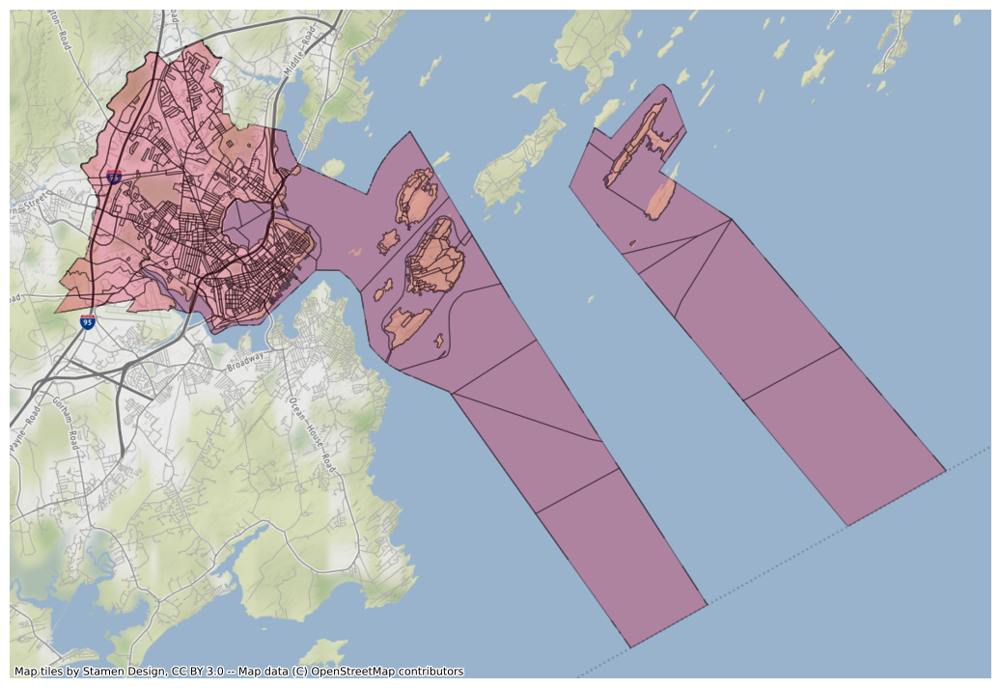

In [5]:
ax = hexes.plot(alpha=0.3, facecolor="crimson", edgecolor="k")
ax.axis("off")
cx.add_basemap(ax)

Because this approach assumes walking distance, results aren't valid for "blocks" that are primarily areas of water. We can filter these out using the 'AWATER20' column.

In [6]:
# manually remove islands
blocks = blocks[blocks["AWATER20"] == 0]

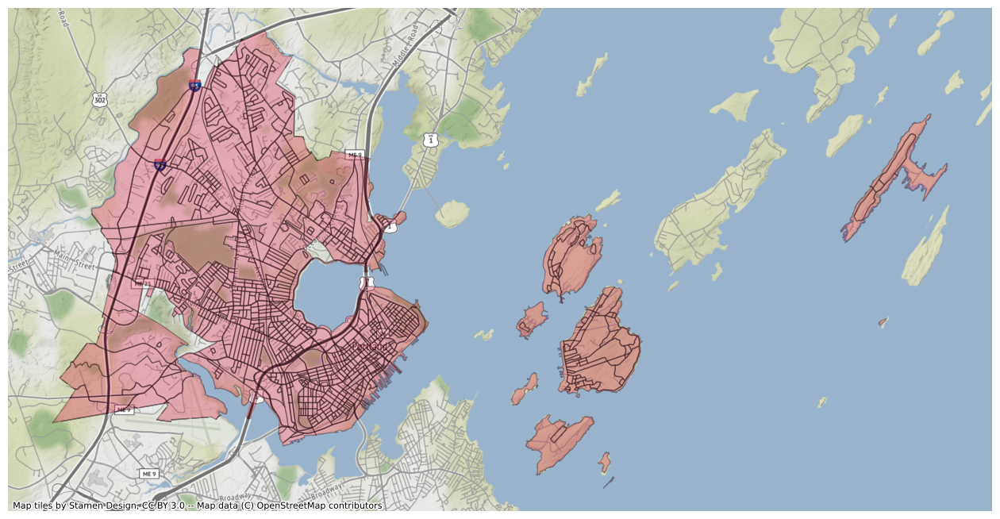

In [7]:
ax = hexes.plot(alpha=0.3, facecolor="crimson", edgecolor="k")
ax.axis("off")
cx.add_basemap(ax)
# plt.savefig('figs/hexes.png')

## Create H3 Tiles at Similar Resolution

To repeat this analysis with regular spatial sampling, we want to utilize H3 tiles of roughly equivalent area to the census blocks.

In [8]:
blocks.ALAND20.describe()

count    1.056000e+03
mean     6.239362e+04
std      1.679217e+05
min      5.290000e+02
25%      9.170750e+03
50%      1.592950e+04
75%      3.514350e+04
max      1.449351e+06
Name: ALAND20, dtype: float64

According to the H3 docs, resolution 10 averages 1.5e4 m**2 per tile, which is roughly right for our application. Note that we have to transform to EPSG:4326 to utilize h3pandas!

In [22]:
hexes = blocks.dissolve(aggfunc={"POP20": "sum"}).to_crs(4326).h3.polyfill_resample(10).to_crs(3857)

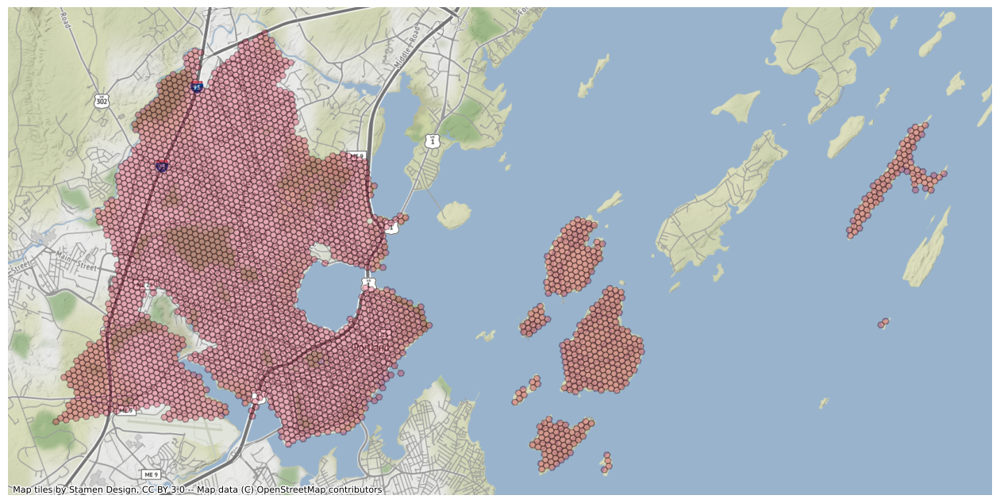

In [23]:
ax = hexes.plot(alpha=0.3, facecolor="crimson", edgecolor="k")
ax.axis("off")
cx.add_basemap(ax)
# plt.savefig('figs/hexes.png')

## Download and prep the street network

This is usually the most time-consuming step, as the size of the graph could be arbitrarily large. To speed up computation, download the graph separately and load it from local storage.

In [24]:
filepath = "../data/graphs/greater_portland.graphml"

if os.path.isfile(filepath):
    # load from file
    G = ox.load_graphml(filepath)
else:
    # download the street network
    bbox = hexes.to_crs("EPSG:4326").geometry.unary_union.envelope.bounds
    buffer = 0.05  # unit is lat/lon degrees
    network_type = "walk"
    G = ox.graph_from_bbox(
        bbox[3] + buffer,
        bbox[1] - buffer,
        bbox[2] + buffer,
        bbox[0] - buffer,
        network_type=network_type,
    )
    ox.save_graphml(G, filepath)

G = ox.project_graph(G, "EPSG:3857")  # project the graph to UTM for this zone

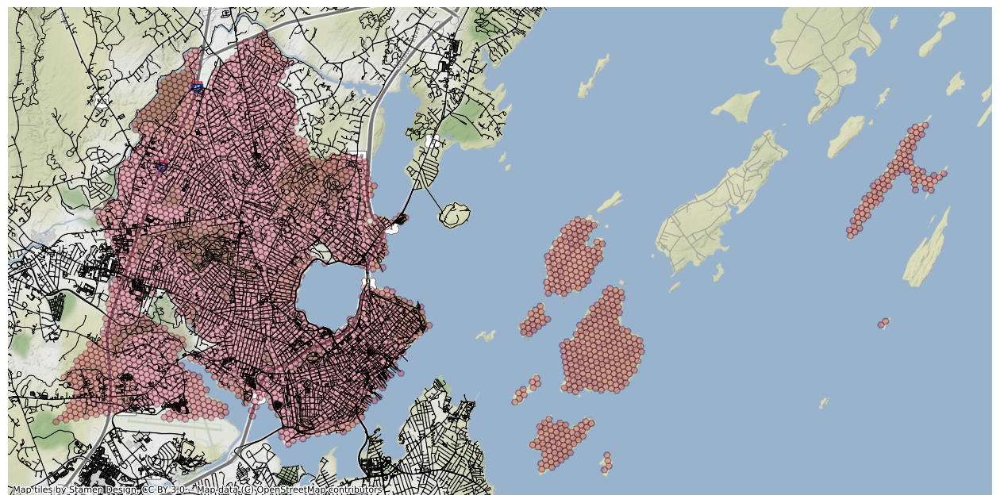

In [25]:
ax = hexes.plot(alpha=0.3, facecolor="crimson", edgecolor="k")
ax.axis("off")
bbox_nsew = tuple(reversed(ax.get_xlim() + ax.get_ylim()))
ox.plot_graph(
    G,
    ax=ax,
    bgcolor=None,
    show=False,
    close=False,
    node_size=1,
    bbox=bbox_nsew,
    node_color="k",
    edge_color="k",
    edge_linewidth=0.5,
)
cx.add_basemap(ax)
# plt.savefig('figs/roads.png')

For each census tract, we need to find the closest node on the graph. (This will allow us to compute distance entirely in terms of graph distance, as opposed to relying on spatial projections which are both slower and possibly less accurate.)

Median Distance:  83 m


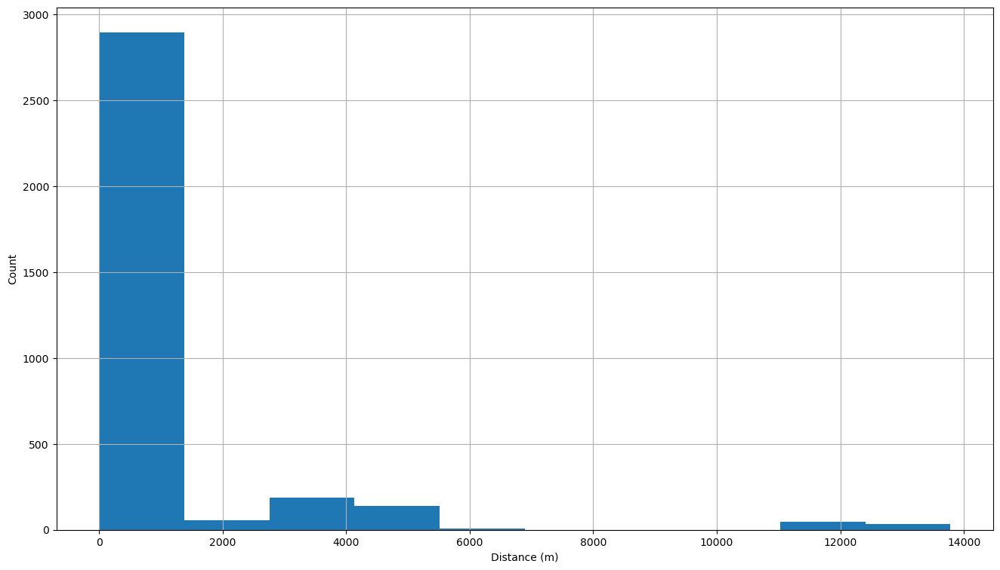

In [27]:
# use a spatial index to efficiently find nearest nodes
gdf_nodes = ox.graph_to_gdfs(G, edges=False).reset_index()
hexes["osmid"] = gdf_nodes.loc[gdf_nodes.sindex.nearest(hexes.centroid)[1]]["osmid"].values
center_nodes_gdf = ox.graph_to_gdfs(G, edges=False).loc[hexes["osmid"]]

# verify that nodes are reasonably close
center_nodes_gdf["distance"] = center_nodes_gdf.distance(hexes.centroid, align=False)
ax = center_nodes_gdf["distance"].hist()
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Count")
print(f"Median Distance: {center_nodes_gdf['distance'].median():3.0f} m")

There's clearly an issue here. The median distance is just 79 m, but there are several nodes with distances over a kilometer. Further investigation would show that this happens when the islands are mapped to nodes on the mainland. To dodge this issue, we can filter nodes where the distance is too high (say, >500m)

In [28]:
center_nodes_gdf = center_nodes_gdf[center_nodes_gdf["distance"] < 500]

Median Distance:  70 m


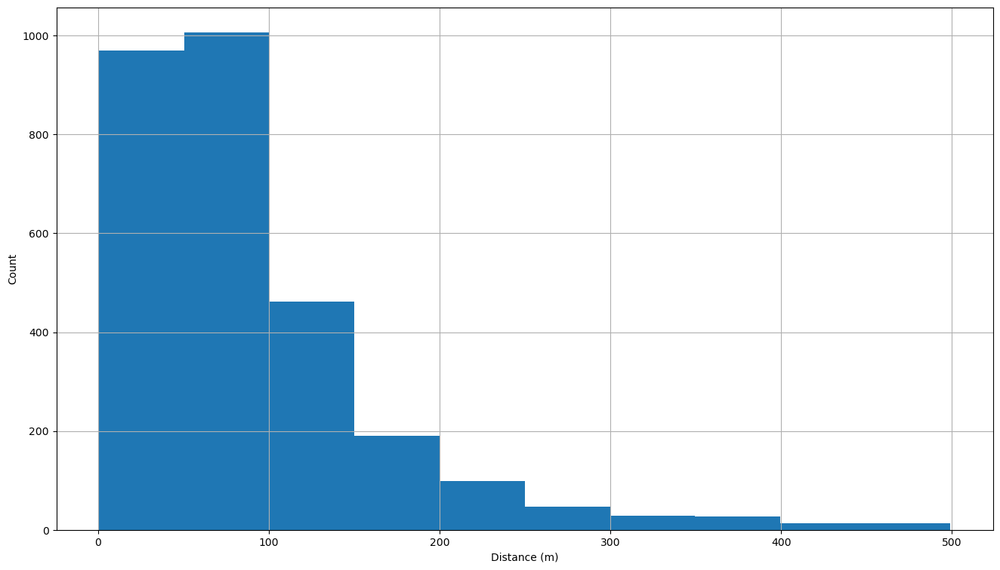

In [29]:
ax = center_nodes_gdf["distance"].hist()
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Count")
print(f"Median Distance: {center_nodes_gdf['distance'].median():3.0f} m")

## Plot nodes you can reach on foot within each time

How far can you walk in 5, 10, 15, 20, 30, 45, and 60 minutes from the origin node? We'll use NetworkX to induce a subgraph of G within each distance, based on trip time and travel speed.

In [30]:
# configure trip times and travel speed
trip_times = [5, 10, 15, 20, 30, 45, 60]  # in minutes
travel_speed = 4.5  # walking speed in km/hour

In [31]:
# add an edge attribute for time in minutes required to traverse each edge
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in G.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [32]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0, return_hex=True)

Processing Node 101575557


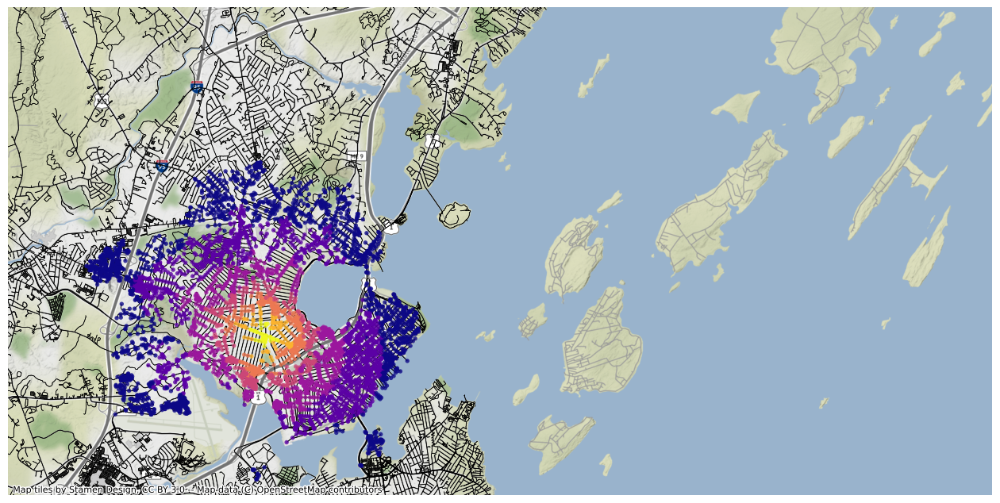

In [37]:
center_node = center_nodes_gdf.index[100]
print(f"Processing Node {center_node}")
# color the nodes according to isochrone then plot the street network
node_times = {}
node_colors = {}
# loop over allowed trip times
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors, strict=False):
    # find subgraph from center node
    subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
    # color nodes according to the isoline
    for node in subgraph.nodes():
        node_times[node] = trip_time
        node_colors[node] = color
# set node size and color for unreachable nodes
nc = [node_colors[node] if node in node_colors else "none" for node in G.nodes()]
ns = [15 if node in node_colors else 0 for node in G.nodes()]
# show the result
fig, ax = ox.plot_graph(
    G,
    bgcolor=None,
    node_color=nc,
    node_size=ns,
    bbox=bbox_nsew,
    edge_color="k",
    edge_linewidth=0.5,
    node_alpha=0.8,
    show=False,
    close=False,
    figsize=(16, 9),
    dpi=300,
)
cx.add_basemap(ax)
# plt.savefig('figs/node_distance.png')

## Plot the time-distances as isochrones

Rather than just labelling the nodes by walk time, it's convenient to generate convex polygons that approximate the area within each walk time. This will facilitate spatial analysis later on.

In [40]:
def make_iso_polys(G, edge_buff=25, node_buff=50, infill=False):
    isochrone_polys = []
    for trip_time in sorted(trip_times, reverse=True):
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")

        node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
        nodes_gdf = gpd.GeoDataFrame({"id": list(subgraph.nodes)}, geometry=node_points)
        nodes_gdf = nodes_gdf.set_index("id")

        edge_lines = []
        for n_fr, n_to in subgraph.edges():
            f = nodes_gdf.loc[n_fr].geometry
            t = nodes_gdf.loc[n_to].geometry
            edge_lookup = G.get_edge_data(n_fr, n_to)[0].get("geometry", LineString([f, t]))
            edge_lines.append(edge_lookup)

        n = nodes_gdf.buffer(node_buff).geometry
        e = gpd.GeoSeries(edge_lines).buffer(edge_buff).geometry
        all_gs = list(n) + list(e)
        new_iso = gpd.GeoSeries(all_gs).unary_union

        # try to fill in surrounded areas so shapes will appear solid and
        # hexes without white space inside them
        if infill:
            new_iso = Polygon(new_iso.exterior)
        isochrone_polys.append(new_iso)
    return isochrone_polys


# make the isochrone polygons
isochrone_polys = make_iso_polys(G, edge_buff=5, node_buff=0, infill=True)
iso_poly_gdf = gpd.GeoDataFrame.from_dict(
    {"trip_times": trip_times, "geometry": isochrone_polys}, crs="EPSG:3857"
)

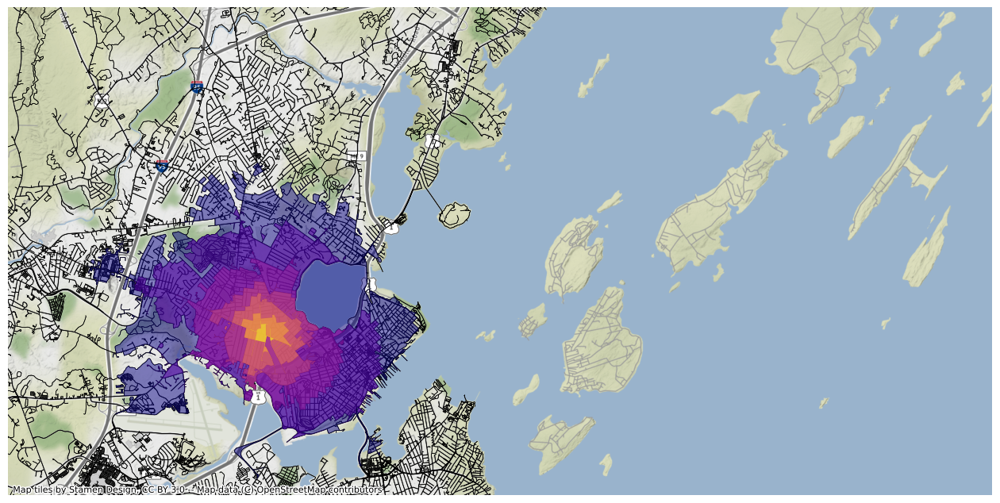

In [41]:
# plot the network then add isochrones as colored polygon patches
fig, ax = ox.plot_graph(
    G,
    bgcolor=None,
    node_size=0,
    bbox=bbox_nsew,
    edge_color="k",
    edge_linewidth=0.5,
    show=False,
    close=False,
    figsize=(16, 9),
    dpi=300,
)
iso_poly_gdf.plot(ax=ax, color=iso_colors, ec="none", alpha=0.5)
cx.add_basemap(ax)
# plt.savefig('figs/poly_dist.png')

## Load Conserved Lands based on bounding box
The next step is to use the walk time polygons to find conserved lands within each walk time. We start by getting all conserved lands in and near our isochrones.

In [42]:
# make an ESRI geometry JSON object from the bounding box
# https://developers.arcgis.com/rest/services-reference/enterprise/query-map-service-layer-.htm
bbox_json = json.dumps({"points": iso_poly_gdf.geometry.unary_union.envelope.exterior.coords[:]})
bbox_json

'{"points": [[-7830015.815044117, 5408899.307322241], [-7819256.075467385, 5408899.307322241], [-7819256.075467385, 5419177.939010961], [-7830015.815044117, 5419177.939010961], [-7830015.815044117, 5408899.307322241]]}'

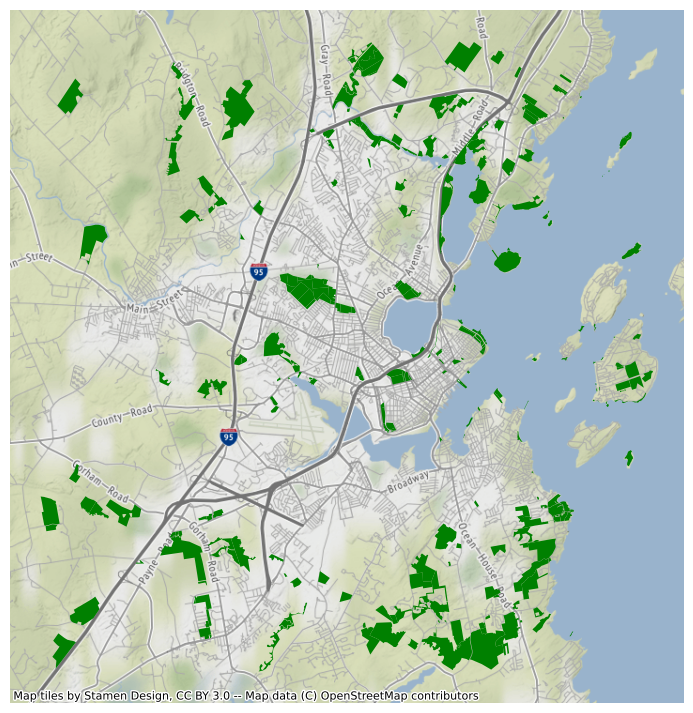

In [43]:
# get all conserved parcels within 3 mile radius of this polygon
lands = gpd.read_file(
    "https://gis.maine.gov/arcgis/rest/services/acf/Conserved_Lands/MapServer/0/query?"
    + "where=&text=&objectIds=&time=&timeRelation=esriTimeRelationOverlaps&geometry="
    + urllib.parse.quote(bbox_json)
    + "&geometryType=esriGeometryMultipoint&inSR=3857&spatialRel=esriSpatialRelEnvelopeIntersects&"
    + "distance="
    + str(3)
    + "&units=esriSRUnit_StatuteMile&outFields=*&returnGeometry=true&returnTrueCurves=false&outSR=3857&returnIdsOnly=false&returnCountOnly=false&returnZ=false&returnM=false&returnDistinctValues=false&returnExtentOnly=false&sqlFormat=none&featureEncoding=esriDefault&f=geojson"
)
ax = lands.plot(color="g")
ax.axis("off")
cx.add_basemap(ax)

## Identify Conserved Lands within Isochrones
Here again we map each land to its centroid, then each centroid to the nearest graph node.

In [44]:
# use a spatial index to efficiently find nearest nodes
gdf_nodes_cl = ox.graph_to_gdfs(G, edges=False).reset_index()
# find the nearest node and retrieve a list of osmids
lands["osmid"] = gdf_nodes_cl.loc[gdf_nodes_cl.sindex.nearest(lands.centroid)[1]]["osmid"].values
center_nodes_cl_gdf = ox.graph_to_gdfs(G, edges=False).loc[lands["osmid"].tolist()]

Median Distance: 108 m


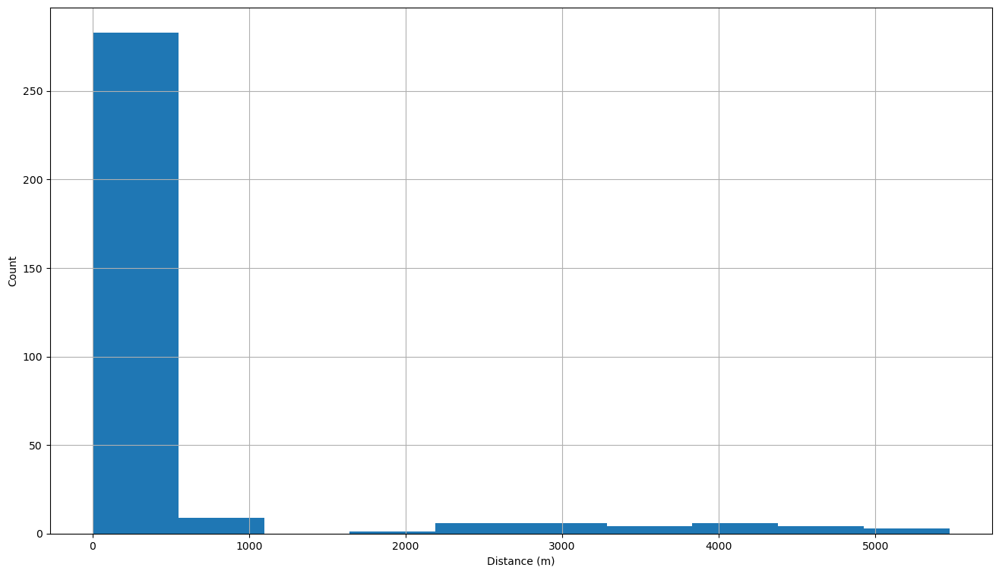

In [45]:
# verify that nodes are reasonably close
center_nodes_cl_gdf["distance"] = center_nodes_cl_gdf.distance(lands.centroid, align=False)
ax = center_nodes_cl_gdf["distance"].hist()
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Count")
print(f"Median Distance: {center_nodes_cl_gdf['distance'].median():3.0f} m")

As with before, we will drop nodes that are too far from the actual centers.

In [46]:
lands = lands[center_nodes_cl_gdf.reset_index()["distance"] < 500]
center_nodes_cl_gdf = center_nodes_cl_gdf[center_nodes_cl_gdf["distance"] < 500]

Median Distance:  93 m


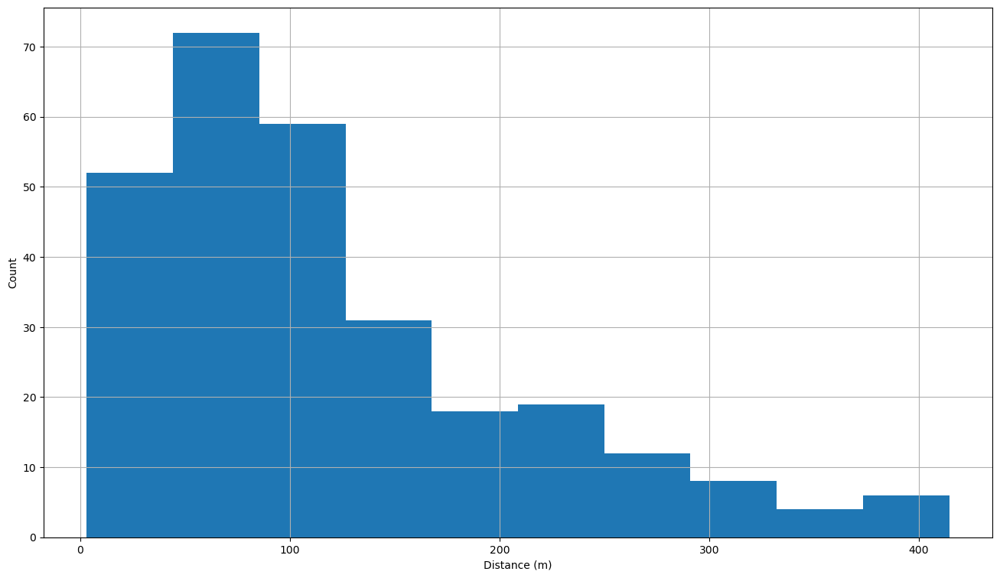

In [47]:
# verify that nodes are reasonably close
ax = center_nodes_cl_gdf["distance"].hist()
ax.set_xlabel("Distance (m)")
ax.set_ylabel("Count")
print(f"Median Distance: {center_nodes_cl_gdf['distance'].median():3.0f} m")

## Calculating Trip Times
As an example, we can take the node we plotted above and look at all the conserved land within different walking distances.

In [48]:
# create a dataframe with the points
lands_points = lands.copy()
lands_points["trip_times"] = [
    node_times[node] if node in node_times else None for node in lands["osmid"].tolist()
]
lands_colors = [
    node_colors[node] if node in node_colors else "none" for node in lands["osmid"].tolist()
]
lands_edgecolors = ["green" if node in node_colors else "none" for node in lands["osmid"].tolist()]

How many conserved lands are within each trip time?

In [49]:
# calculate the number of lands within each trip time
lands_points.groupby("trip_times")["OBJECTID"].count()

trip_times
10.0     2
20.0     1
30.0    15
45.0    37
60.0    27
Name: OBJECTID, dtype: int64

What area of conserved land is within each trip time?

In [50]:
lands_points.groupby("trip_times")["CALC_AC"].sum()

trip_times
10.0     13.417706
20.0     18.769798
30.0    104.524564
45.0    360.430043
60.0    124.384664
Name: CALC_AC, dtype: float64

Where are these properties on the map?

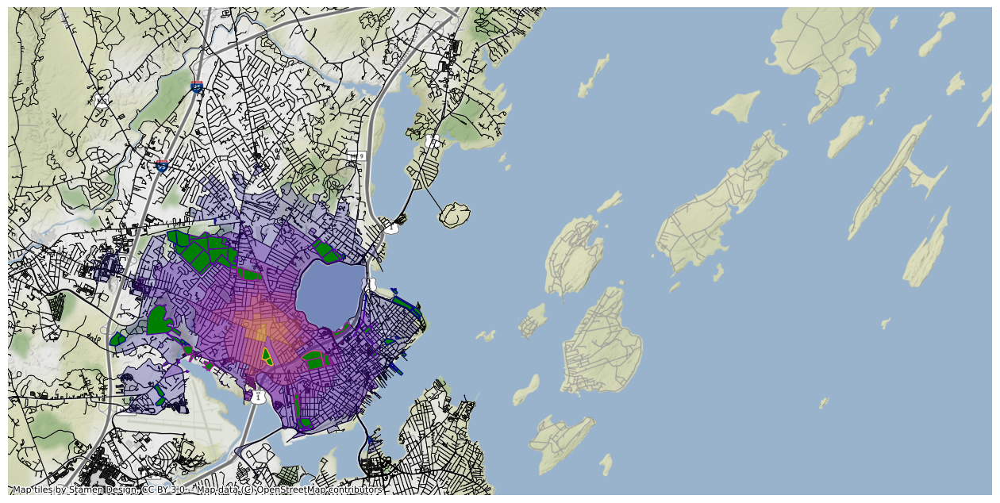

In [51]:
# plot the network then add isochrones as colored polygon patches
fig, ax = ox.plot_graph(
    G,
    bgcolor=None,
    node_size=0,
    bbox=bbox_nsew,
    edge_color="k",
    edge_linewidth=0.5,
    show=False,
    close=False,
    figsize=(16, 9),
    dpi=300,
)
iso_poly_gdf.plot(ax=ax, color=iso_colors, ec="none", alpha=0.25)
# note - we flipped "color" and "edgecolor" intentionally to provide better contrast
lands_points.plot(ax=ax, color=lands_edgecolors, edgecolor=lands_colors)
cx.add_basemap(ax)
# plt.savefig('figs/conserved_dist.png')

List the properties by walk time

In [52]:
lands_points.sort_values("trip_times")

,created_user,created_date,last_edited_user,last_edited_date,PROJECT,PARCEL_NAME,DESIGNATION,CONS1_TYPE,HOLD1_NAME,HOLD1_TYPE,...,CL_UNIQUEID,GlobalID,TAX_MAP_TOWN,TAX_MAP_BOOK_LOT,OBJECTID,Shape.STArea(),Shape.STLength(),geometry,osmid,trip_times
135,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,NaN,079 B001,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,10597,{A131991E-9982-46F4-B9F2-FF1966E97FF7},NaN,NaN,44249,34379.511412,777.396075,"POLYGON ((-7824189.895 5413152.022, -7824255.1...",5122376906,10.0
133,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,NaN,066 A002,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,10530,{25A37745-84FB-446A-AA04-8865501481F5},NaN,NaN,37373,19920.017958,565.746229,"POLYGON ((-7823963.679 5412626.126, -7823966.5...",4518485467,10.0
284,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,NaN,050 A001,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,10595,{2C0625C6-7EBE-41F9-A487-9D2712D72274},NaN,NaN,45172,75958.677644,1609.127199,"POLYGON ((-7822435.714 5413044.023, -7822440.1...",321059770,20.0
9,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,NaN,064 E024,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,10537,{0E7C94A4-F9DE-4D12-9F3B-3D3FD610FE56},NaN,NaN,44686,13171.240383,488.163150,"POLYGON ((-7823137.933 5411512.295, -7823160.9...",316629404,30.0
126,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,Back Cove Trail,442 B001,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,8962,{5498AB01-C701-406F-8887-099D101E5CF2},NaN,NaN,39592,36760.721746,1156.706137,"POLYGON ((-7821717.118 5413670.103, -7821699.9...",5369244101,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,Scott Dyer Road,NaN,NaN,Fee,Cape Elizabeth Land Trust,Private,...,2896,{6992F185-1565-498E-B157-8A3B8C9A4711},NaN,NaN,45836,24780.494980,641.346312,"POLYGON ((-7819054.312 5402534.578, -7819052.0...",101337658,NaN
314,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,South Portland Municipal Boat Ramp,,NaN,Fee,Maine Minor Civil Division,Municipal,...,8988,{93111679-B1B9-424B-B511-A6BEBEAB56B8},NaN,NaN,39550,13679.185466,665.305478,"POLYGON ((-7818702.667 5412095.663, -7818672.3...",101279629,NaN
315,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,Jennie & Issac E. Willey Recreation Area,NaN,NaN,Fee,Maine Minor Civil Division,Municipal,...,4210,{6AD8228B-92BD-46C4-A94B-5926AF81B9C6},NaN,NaN,36696,10270.382954,430.834434,"POLYGON ((-7824032.440 5402626.611, -7824027.4...",9872132796,NaN
320,MECONSLANDS,1683927174000,MECONSLANDS,1683927174000,Fort Williams,U48001000000,Miscellaneous Municipal Lands,Fee,Maine Minor Civil Division,Municipal,...,9957,{9279E34A-A5BB-411C-9C41-EE9B819B9774},NaN,NaN,46377,1911.718352,190.080718,"POLYGON ((-7816144.669 5407126.113, -7816155.1...",6464651993,NaN


## Putting it all together

In [53]:
land_nodes = lands["osmid"].values


def get_lands(center_node=102322137):
    for trip_time in trip_times:
        # find subgraph from center node
        subgraph = nx.ego_graph(G, center_node, radius=trip_time, distance="time")
        # set node distance to current trip_time
        for node in subgraph.nodes():
            if node in land_nodes:
                return trip_time
    return None


center_nodes_gdf["min_time"] = center_nodes_gdf.index.to_series().progress_apply(get_lands)

  0%|          | 0/2858 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Distribution of Walking Times to Nearest Conservation Land, by Census Block')

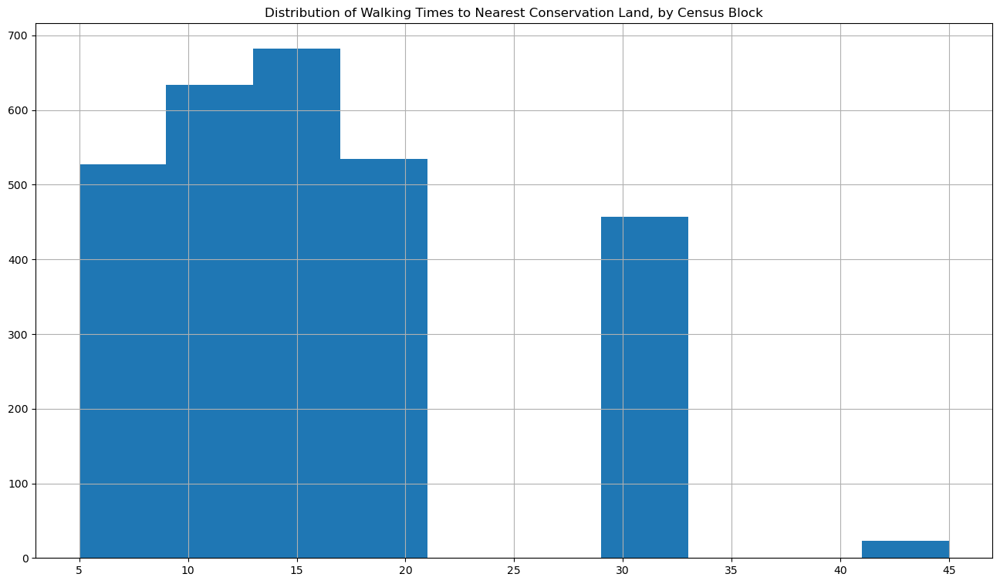

In [54]:
ax = center_nodes_gdf["min_time"].hist()
ax.set_title("Distribution of Walking Times to Nearest Conservation Land, by Census Block")
# plt.savefig('figs/block_hist.png')

In [55]:
hexes_merge = hexes.merge(center_nodes_gdf["min_time"], left_on="osmid", right_index=True)

Text(0.5, 1.0, 'Distribution of Walking Times to Nearest Conservation Land, per Capita')

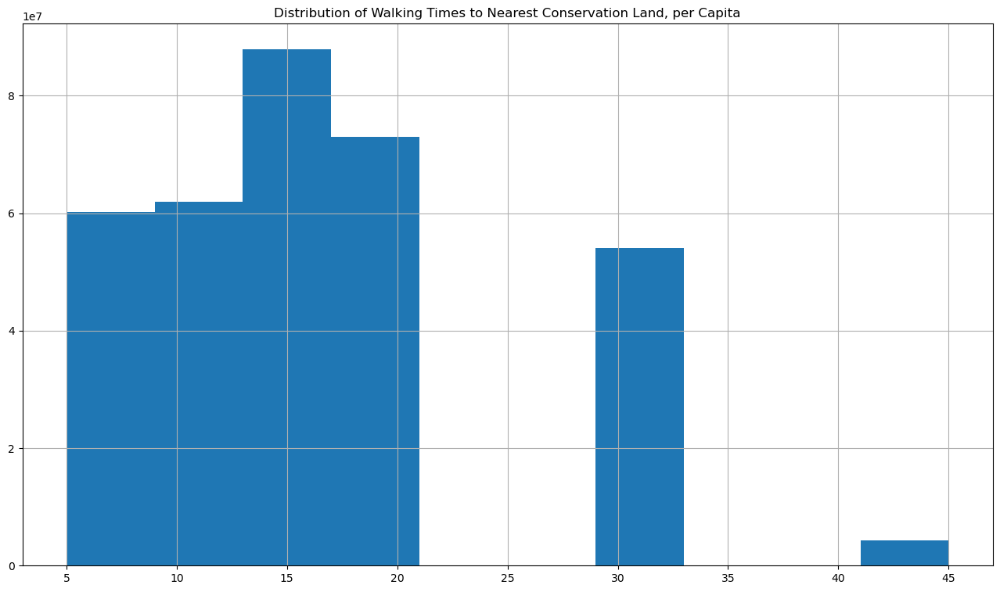

In [56]:
ax = hexes_merge["min_time"].hist(weights=hexes_merge["POP20"])
ax.set_title("Distribution of Walking Times to Nearest Conservation Land, per Capita")
# plt.savefig('figs/pop_hist.png')

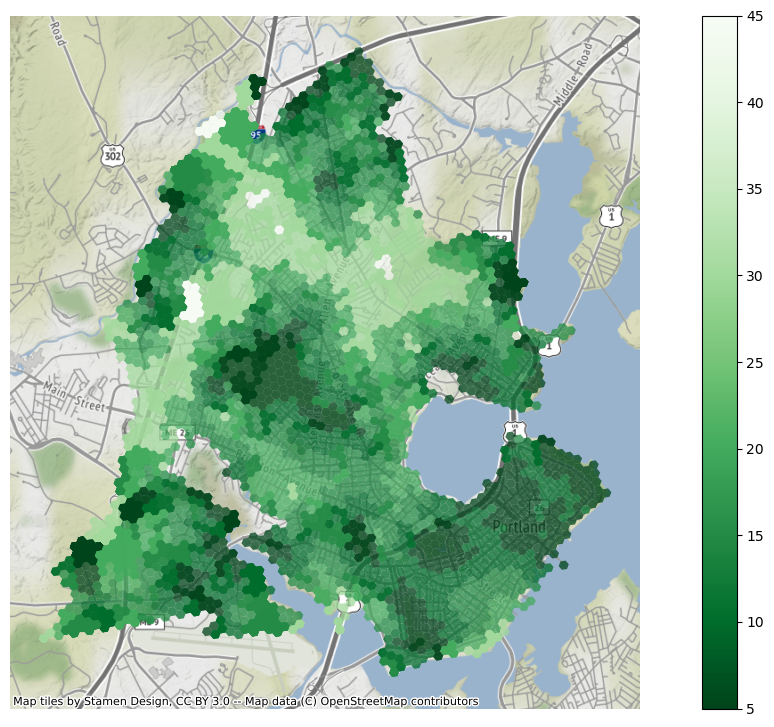

In [57]:
ax = hexes_merge.plot("min_time", legend=True, cmap="Greens_r", alpha=0.75)
ax.axis("off")
cx.add_basemap(ax)
# plt.savefig('figs/choropleth.png')